Trong dự án này, chúng ta sẽ sử dụng deep learning kết hợp transfer learning để xây dựng mô hình phân loại giống chó 🐶 từ một hình ảnh bất kỳ.

Dữ liệu để đưa train, kiểm định mô hình và test sẽ được lấy từ [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview). Trong đó có 10000+ hình ảnh gồm 120 giống chó khác nhau. 

Dự án này được gọi là phân loại ảnh nhiều lớp (multi classification) vì có đến 120 class. Nếu chúng ta chỉ cố gắng phân loại 2 class (chẳng hạn như phân biệt hình ảnh đó là chó hay là mèo) thì nó sẽ được gọi là phân loại nhị phân (binary class).

Nội dung của bài viết này  bao gồm : 
1. Tải dữ liệu và khám phá dữ liệu 
2. Tiền xử lý dữ liệu 
3. Khởi tạo và train mô hình 
  + Giới thiệu về các hàm callback giám sát mô hình train
  + Xây dựng mô hình ResnetV50 trích xuất đặc trưng
  + Xây dựng mô hình EfficientNet trích xuất đặc trưng
  + Tinh chỉnh mô hình trích xuất đặc trưng.
    + Đánh giá mô hình tinh chỉnh
    + Lưu mô hình
4. Đánh giá và dự đoán mô hình trên dữ liệu kiểm địn.
5. Mô hình dự đoán dữ liệu test. 



# 1. Tải dữ liệu và khám phá dữ liệu 

Bạn có thể tải dữ liệu từ [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview) về máy và sau đó upload ngay tại Google Colab, hoặc lưu trong Google Driver. Một cách khác là nén dữ liệu dưới dạng file zip và đưa lên cloud.

Tập dữ liệu gồm có 2 folder `train` và `test`. Trong folder `train` và `test` là những file ảnh mà tên của nó được thể hiện dưới dạng `id`.

Đối với `train`, bạn có thể tìm thấy label của  nó thông qua file `labels.csv`. Trong khi folder `test` là nơi để sau này chúng ta sẽ tiến hành dự đoán và nếu cần thiết bạn có thể deploy lên [Kaggle dog breed identification competition](https://www.kaggle.com/c/dog-breed-identification/overview). 

> 🔑**Lưu ý** : Chúng ta sẽ chỉ làm việc trên folder `train`, còn `test` chỉ là phần dự đoán mô hình sau khi quá trình `train` và `validation` kết thúc. 

In [ ]:
!wget https://www.dropbox.com/s/e1x3kpy1ct31h0e/dog-breed-identification.zip

--2021-09-18 03:05:22--  https://www.dropbox.com/s/e1x3kpy1ct31h0e/dog-breed-identification.zip
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6030:18::a27d:5012
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/e1x3kpy1ct31h0e/dog-breed-identification.zip [following]
--2021-09-18 03:05:22--  https://www.dropbox.com/s/raw/e1x3kpy1ct31h0e/dog-breed-identification.zip
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8a01b0a674e6bda337167deaad.dl.dropboxusercontent.com/cd/0/inline/BWXPyVKyk9AL-IPaE-fCbWq2kGFeDpf2UB-_OPh8NftYG3BSYmndNiOrDKBt2PfgJA4pq2R34ZXVQC77OwOxoNrxs0tnN9LeopDdYbAkn3gQ5NfLbhA1s9ilmXD45-tppfuIBJcojv4w9KVKNcXdxOQa/file# [following]
--2021-09-18 03:05:23--  https://uc8a01b0a674e6bda337167deaad.dl.dropboxusercontent.com/cd/0/inline/BWXPyVKyk9AL-IPaE-fCbWq2kGFeDpf2UB-_OPh8N

Để tiết kiệm thời gian cũng như giúp cho notebook được rõ ràng, thay vì phải viết lại các hàm đã sử dụng rất nhiều lần từ các module trước, bạn có thể tạo hàm `utility_functions.py` rồi `import` hoặc tải trưc tiếp xuống. 

In [ ]:
!wget https://www.dropbox.com/s/v4sla7jvi9cltg8/utility_functions.py

--2021-09-18 03:05:33--  https://www.dropbox.com/s/v4sla7jvi9cltg8/utility_functions.py
Resolving www.dropbox.com (www.dropbox.com)... 162.125.3.18, 2620:100:6018:18::a27d:312
Connecting to www.dropbox.com (www.dropbox.com)|162.125.3.18|:443... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: /s/raw/v4sla7jvi9cltg8/utility_functions.py [following]
--2021-09-18 03:05:33--  https://www.dropbox.com/s/raw/v4sla7jvi9cltg8/utility_functions.py
Reusing existing connection to www.dropbox.com:443.
HTTP request sent, awaiting response... 302 Found
Location: https://uc8b9c237e4f7792421b84cae96e.dl.dropboxusercontent.com/cd/0/inline/BWXHUG1nXD46gNNptpZSzTVBPk0d-YhZPasPzWhcgRV3a04qCT9MyPzilL5Jp7Vq3C7GtiodsFuzZq-YWrkkYbm-9kAj59qwESu0oLL9v9VfLT4v7kQA-gCeqnH2gXMewjNjNBYfCkCRextnxaIl_Pow/file# [following]
--2021-09-18 03:05:33--  https://uc8b9c237e4f7792421b84cae96e.dl.dropboxusercontent.com/cd/0/inline/BWXHUG1nXD46gNNptpZSzTVBPk0d-YhZPasPzWhcgRV3a04qCT9MyPzilL5Jp7Vq3C

In [ ]:
from utility_functions import unzip_file,walk_through_directory

Đầu tiên, bạn cần giải nén file zip. Vì file zip này không khi giải nén sẽ có folder `train`, `test` và tập tin `labels.csv`... nên sẽ khiến cho thư mục hiện tại sẽ rất khó nhìn. Vì vậy, chúng ta sẽ tạo một thư mục có tên `dog-breed-identification`, sau đó, dời file `dog-breed-identification.zip` vào trong thư mục này rồi mới tiến hành giải nén. 

In [ ]:
import os
import shutil

zip_name = "dog-breed-identification.zip"
dog_breed_dir = "dog-breed-identification"
if not os.path.isdir(dog_breed_dir): 
  # Tạo thư mục
  os.mkdir(dog_breed_dir)
  # Đưa tập tin vào thư mục vừa khởi tạo
  shutil.move(zip_name,dog_breed_dir)
  zip_path = os.path.join(dog_breed_dir, zip_name)
  # chuyển vị trí hoạt động 
  os.chdir(dog_breed_dir)
  # Giải nén tập tin
  unzip_file(zip_name)
  # Xóa tập tin .zip
  os.remove(zip_name)
  # Dời vị trí về ban đầu
  os.chdir("..")

Khám phá các dữ liệu trong các thư mục con của `dog-breed-identification` 

In [ ]:
walk_through_directory(dog_breed_dir)

Có 2 thư mục và 2 tập tin trong thư mục dog-breed-identification
Có 0 thư mục và 10222 tập tin trong thư mục dog-breed-identification/train
Có 0 thư mục và 10357 tập tin trong thư mục dog-breed-identification/test


Trong thư mục `train` chỉ gồm các hình ảnh và tên của nó là những `id`. Tuy nhiên, tập tin `label.csv` đã cung cấp thông tin của những `id` này để chúng ta có thể xử lý, lọc dữ liệu lại. 

In [ ]:
import pandas as pd
import numpy as np

File `labels.csv` mô tả label của mỗi hình ảnh trong folder `train`, tên hình ảnh được thể hiện dưới dạng `id` của nó.

In [ ]:
labels_csv = pd.read_csv(os.path.join(dog_breed_dir, "labels.csv"))
labels_csv

,id,breed
0,000bec180eb18c7604dcecc8fe0dba07,boston_bull
1,001513dfcb2ffafc82cccf4d8bbaba97,dingo
2,001cdf01b096e06d78e9e5112d419397,pekinese
3,00214f311d5d2247d5dfe4fe24b2303d,bluetick
4,0021f9ceb3235effd7fcde7f7538ed62,golden_retriever
...,...,...
10217,ffd25009d635cfd16e793503ac5edef0,borzoi
10218,ffd3f636f7f379c51ba3648a9ff8254f,dandie_dinmont
10219,ffe2ca6c940cddfee68fa3cc6c63213f,airedale
10220,ffe5f6d8e2bff356e9482a80a6e29aac,miniature_pinscher


Thống kê só lượng hình ảnh của mỗi giống chó. 

In [ ]:
dog_breeds_counts_df = labels_csv["breed"].value_counts()
dog_breeds_counts_df = pd.DataFrame(dog_breeds_counts_df).rename(columns={"breed" : "count"}).sort_values(by="count",ascending=False)
dog_breeds_counts_df

,count
scottish_deerhound,126
maltese_dog,117
afghan_hound,116
entlebucher,115
bernese_mountain_dog,114
...,...
brabancon_griffon,67
komondor,67
golden_retriever,67
eskimo_dog,66


In [ ]:
import matplotlib.pyplot as plt 

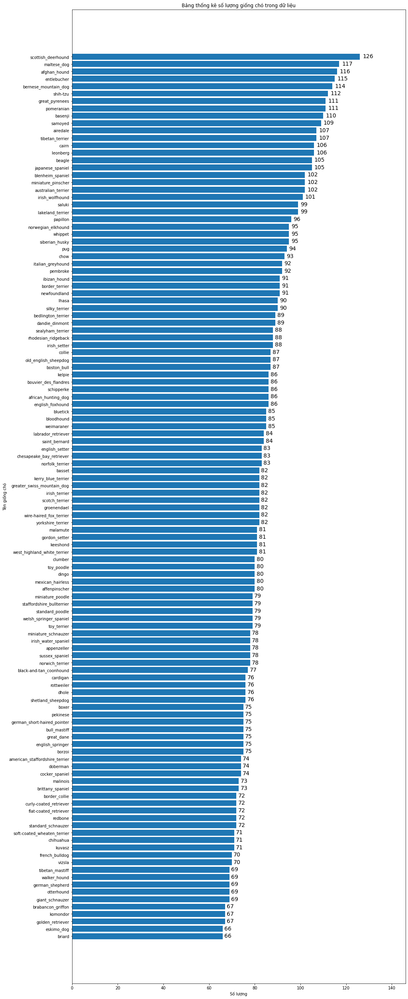

In [ ]:
fig,ax = plt.subplots(figsize=(15,45))
rects = ax.barh(dog_breeds_counts_df.index, dog_breeds_counts_df["count"])
ax.set_title("Bảng thống kê số lượng giống chó trong dữ liệu")
ax.set_xlabel("Số lượng") 
ax.set_ylabel("Tên giống chó")
ax.set_xlim([0, dog_breeds_counts_df["count"].max() + 20])
ax.invert_yaxis()
for rect in rects : 
  x,y = rect.get_width(), rect.get_y()
  plt.text(x*1.01,y, f"{x}", ha="left", va="top", fontsize=14)

*Biểu đồ thống kê số file ảnh cho từng giống chó trong tập dữ liệu train*

Sử dụng `pandas` để tạo bảng đường dẫn đến file ảnh và tên giống chó trong ảnh.

In [ ]:
dog_breed_df = pd.DataFrame({
    "image_path" : [os.path.join(dog_breed_dir , "train", id + ".jpg") for id in labels_csv["id"]] , 
    "label" : labels_csv["breed"]
})

In [ ]:
dog_breed_df

,image_path,label
0,dog-breed-identification/train/000bec180eb18c7...,boston_bull
1,dog-breed-identification/train/001513dfcb2ffaf...,dingo
2,dog-breed-identification/train/001cdf01b096e06...,pekinese
3,dog-breed-identification/train/00214f311d5d224...,bluetick
4,dog-breed-identification/train/0021f9ceb3235ef...,golden_retriever
...,...,...
10217,dog-breed-identification/train/ffd25009d635cfd...,borzoi
10218,dog-breed-identification/train/ffd3f636f7f379c...,dandie_dinmont
10219,dog-breed-identification/train/ffe2ca6c940cddf...,airedale
10220,dog-breed-identification/train/ffe5f6d8e2bff35...,miniature_pinscher


Kiểm tra xem có bao nhiêu giống chó trong tập dữ liệu

In [ ]:
class_names = labels_csv["breed"].unique()
class_names.sort()

In [ ]:
class_names 

array(['affenpinscher', 'afghan_hound', 'african_hunting_dog', 'airedale',
       'american_staffordshire_terrier', 'appenzeller',
       'australian_terrier', 'basenji', 'basset', 'beagle',
       'bedlington_terrier', 'bernese_mountain_dog',
       'black-and-tan_coonhound', 'blenheim_spaniel', 'bloodhound',
       'bluetick', 'border_collie', 'border_terrier', 'borzoi',
       'boston_bull', 'bouvier_des_flandres', 'boxer',
       'brabancon_griffon', 'briard', 'brittany_spaniel', 'bull_mastiff',
       'cairn', 'cardigan', 'chesapeake_bay_retriever', 'chihuahua',
       'chow', 'clumber', 'cocker_spaniel', 'collie',
       'curly-coated_retriever', 'dandie_dinmont', 'dhole', 'dingo',
       'doberman', 'english_foxhound', 'english_setter',
       'english_springer', 'entlebucher', 'eskimo_dog',
       'flat-coated_retriever', 'french_bulldog', 'german_shepherd',
       'german_short-haired_pointer', 'giant_schnauzer',
       'golden_retriever', 'gordon_setter', 'great_dane',
      

In [ ]:
len(class_names)

120

Thực sự có 120 giống chó. Tiếp theo, chúng ta sẽ tạo `plot_random_images` để hàm vẽ hình ảnh ngẫu nhiên từ những đường dẫn đến file ảnh ở trên. Hàm này nhận tham số `n_samples` được truyền vào số lượng hình ảnh hiển thị.  

In [ ]:
import random
import os 
import math
def plot_random_images(n_samples=1) : 
  if n_samples < 1 : 
    n_samples = 1   
  random_image_indices = random.sample(range(len(dog_breed_df)), k=n_samples)
  n_cols = 3 
  n_rows = math.ceil(n_samples / n_cols)
  plt.figure(figsize=(n_cols*6, n_rows*4))
  for i, image_index in enumerate(random_image_indices) : 
    image_path, label = dog_breed_df.loc[image_index]
    image = plt.imread(image_path)
    plt.subplot(n_rows,n_cols,i+1)
    plt.imshow(image)
    plt.title(label)
    plt.axis(False)


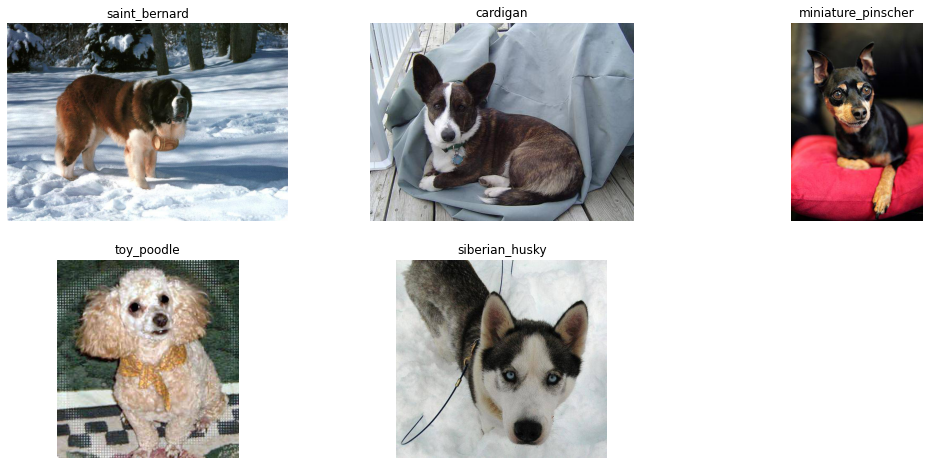

In [ ]:
plot_random_images(5)

Vì label hiện tại có dạng `label-encoded` nghĩa là nó đại diện vị trí label trong 120 class. Chúng ta sẽ để nó các label này thành một mảng gồm 120 phần tử, nếu label có giá trị bao nhiêu thì vị trí tương ứng trong mảng sẽ là `True`, còn lại là `False`. 

In [ ]:
bool_labels = [label == class_names for label in dog_breed_df["label"]]
bool_labels[:3]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

In [ ]:
print(dog_breed_df["label"][0])
print(np.where(dog_breed_df["label"][0] == class_names)[0][0])
print(bool_labels[0].argmax())
print(bool_labels[0].astype(int))

boston_bull
19
19
[0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0]


In [ ]:
bool_labels[:2]

[array([False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False,  True, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False, False, False, False, False, False, False,
        False, False, False]),
 array([False, False, False, False, False, Fal

Thay vì để các mảng labels trên dưới dạng `True` và  `False`, chúng ta đưa chúng về dạng `1` và `0` vì mô hình trong machine learning chỉ hiểu dữ liệu đưới dạng số. Để làm được điều này, chúng ta sẽ ép kiểu cho mảng `bool_labels` trên. 

Trong machine learning, `X` là dữ liệu được đưa vào mô hình để nhận dạng các đặc trưng của một đối tượng (class) nào đó. Còn `y` là label hay cũng được gọi là (class) giúp mô hình nhận dạng dữ liệu `X`. 

In [ ]:
X = dog_breed_df["image_path"].values
y = np.int16(bool_labels)

X[:3], y[:3]

(array(['dog-breed-identification/train/000bec180eb18c7604dcecc8fe0dba07.jpg',
        'dog-breed-identification/train/001513dfcb2ffafc82cccf4d8bbaba97.jpg',
        'dog-breed-identification/train/001cdf01b096e06d78e9e5112d419397.jpg'],
       dtype=object),
 array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
        [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
         0, 0, 0, 0, 0, 0

Vì dữ liệu hiện tại gồm có cả `train` và `test`. Tuy nhiên, chỉ có `train` mới có cả dữ liệu ảnh lẫn label để mô hình nhận dạng, còn `test` chỉ có dữ liệu ảnh thuần. Thông thường, chúng ta cần có cả 2 loại `train` và `test` với đầy đủ cả dữ liệu ảnh lẫn label  để sau mỗi epoch mô hình học xong, nó sẽ kiểm định lại quá trình học trong epoch đó. Nếu mô hình chỉ học xong mà không kiểm định thì không thể đo lường được tính đúng đắn của nó trên tập dữ liệu mà nó chưa từng được học. Vì thế, thay vì cần `test` chúng ta còn có thêm một lựa chọn nữa là tập dữ liệu `validation` để kiểm định mô hình sau khi học. Vậy làm sao để có `validation` ? 

Chúng ta sẽ tách dữ tách dữ liệu `X` và `y` ở trên thành 2 phần, một phần dùng để `train` thường chiếm **70%-80%** tổng số mẫu, `valid` từ **15%-20%**. Và thay vì tách dữ liệu bằng kỹ thuật thủ công, chúng ta sẽ sử dụng `train_test_split` trong `sklearn` vì nó không chỉ giúp chúng ta tách dữ liệu theo đúng tỉ lệ mẫu mà nó còn xáo trộn dữ liệu ngẫu nhiên trước khi tách để dữ liệu không đúng như thứ tự ban đầu nhằm tránh các dữ liệu liên tiếp nhau lại có tương quan với nhau. 

In [ ]:
from sklearn.model_selection import train_test_split

In [ ]:
X_train, X_valid, y_train, y_valid = train_test_split(X,
                                                      y, 
                                                      train_size=0.8,
                                                      random_state=42)
X_train.shape, X_valid.shape, y_train.shape, y_valid.shape

((8177,), (2045,), (8177, 120), (2045, 120))

Số dữ liệu để `train` có 8177 hình ảnh, dữ liệu để kiểm dịnh (`validation`)  là 2045 hình ảnh. Tất cả đều có hình ảnh và label.


## 2. Tiền xử lý dữ liệu (preprocessing data)

Tiền xử lý dữ liệu là quá trình đồng bộ dữ liệu theo đúng một định dạng, kích thước và kiểu dữ liệu để giúp cho mô hình train có thể học nhất quán.

Quá trình tiền xử lý dữ liệu hình ảnh sử dụng tensorflow gồm các bước sau : 
+ Đọc hình ảnh thông qua đường dẫn của nó với `tf.io.read_file` 
+ Chuyển dữ liệu hình ảnh thành tensor thông qua `tf.image.decode_jpeg`
+ Đồng bộ tất cả hình ảnh về chung kích thước `tf.image.resize`

Tạo hàm `load_and_preprocess_image` để load và đồng bộ ảnh. 

In [ ]:
import tensorflow as tf

In [ ]:
IMAGE_SHAPE = (224,224)

def load_and_preprocess_image(image_path) : 
  image = tf.io.read_file(image_path)
  image = tf.image.decode_jpeg(image,channels=3)  
  image = tf.image.resize(image,size=IMAGE_SHAPE)
  return image

Hàm `load_and_preprocess_image` sẽ giúp cho quá trình xử lý ảnh được đồng bộ với nhau.

Nhưng dữ liệu của chúng ta khá lớn, nếu đưa một lúc cả ngàn hình ảnh vào mô hình train sẽ khiến bộ nhớ của GPU có thể không chứa hết được, và lỗi sẽ xảy ra. Do đó, chúng ta cần chuyển tất cả dữ liệu hình ảnh vừa được load và xử lý trong `load_and_preprocess_image` cùng với label của nó thành từng cụm. API `tf.data.Dataset` sẽ đưa dữ liệu thành từng cụm. 

> 🔑Cụm dữ liệu (batch) : Là một tập hợp lượng nhỏ các dữ liệu (cũng như label của nó) lại với nhau để mô hình trong một thời điểm chỉ học một lượng dữ liệu không quá lớn. VD: cụm 32 dữ liệu nghĩa là nó chỉ chứa 32 hình ảnh và 32 label tương ứng để khi đưa vào mô hình, trong một thời điểm nó chỉ học qua 32 dữ liệu này. Sau khi học hết, nó sẽ qua cụm tiếp theo. Số cụm dữ liệu sẽ bằng tổng dữ liệu chia cho số dữ liệu trong một đơn vị cụm. 

Chúng ta sẽ tạo cụm dữ liệu, trong đó chứa cả hình ảnh và label tương ứng. Trước tiên, tạo hàm `get_image_label` để đưa hình ảnh và label lai với nhau trong `tuple` 

In [ ]:
def get_image_label(image_path, label) : 
  image = load_and_preprocess_image(image_path)
  return image, label

Trong tập dữ liệu này có cả 3 kiểu `train`, `test` và `validation`. Tất cả các dữ liệu trong mỗi kiểu này chúng ta sẽ đưa chúng về thành từng cụm, quy trình thực hiện khá tương đồng nhau, chỉ có một số khác biệt sau: 
+ Với kiểu `train`, dữ liệu đưa vào cần cả hình ảnh và label, sau đó dữ liệu phải được xáo trộn thứ tự so với ban đầu. 
+ Với kiểu `validation`, dữ liệu đưa vào cần cả hình ảnh và label,nhưng **không** cần xáo trộn thứ tự vì mô hình chỉ cần kiểm định chứ mô hình không học từ dữ liệu này.
+ Với kiểu `test`, dữ liệu **không** có label nên chỉ cần đưa hình ảnh vào là đủ.

> 🔑**Lưu ý: ** mô hình học kiểu dữ liệu gì, hình dạng, kích thước của nó như thế nào thì sau này, khi nó tiến hành kiểm định với `evaluate()`, hoặc dự đoán xác suất với `predict()` thì kích thước dữ liệu được đưa vào cũng phải tương tự với dữ liệu được train. VD: `32,224,224,3)` là kích thước dữ liệu train, thì khi kiểm định mô hình, bạn cũng cần một tensor với 4 chiểu tương tự như vây.

Cụ thể, hàm `create_data_batches` sẽ sử dụng để tạo 3 kiểu dữ liệu trên với các tham số như sau : 

+ `X` (list str) : đường dẫn đến các file ảnh 
+ `y` (list) mặc định `None`: label của hình ảnh
+ `batch_size` (mặc định 32) :Kích thước dữ liệu trong một cụm.
+ `valid_data` (bool) mặc định `False` : Liệu có phải kiểu dữ liệu để kiểm định `validation` hay không. 
+ `test_data` (bool) mặc định `False` :  Liệu có phải kiểu dữ liệu để thử nghiệm `test` hay không. 

In [ ]:
def create_data_batches(X,y=None, batch_size=32, valid_data=False, test_data=False) : 
  if test_data : 
    print(f"Đang xử lý và chuyển dữ liệu test thành từng cụm.")
    data = tf.data.Dataset.from_tensor_slices(tf.constant(X)).map(load_and_preprocess_image).batch(batch_size)
    print(f"Đã xử lý xong! 💡")
    return data 
  elif valid_data : 
    if y is None : 
      print(f"Tập dữ liệu để kiểm định cần phải có label y.")
      return
    print(f"Đang xử lý và chuyển dữ liệu kiểm định thành từng cụm.")
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X),
                                                tf.constant(y)))
    data = data.map(get_image_label).batch(batch_size)
    print(f"Đã xử lý xong! 💡")
    return data
  else : 
    data = tf.data.Dataset.from_tensor_slices((tf.constant(X), 
                                               tf.constant(y)))
    data = data.map(get_image_label).shuffle(len(X)).batch(batch_size)
    return data 


Để xây dựng mô hình, chúng ta sẽ tạo `train_data` để mô hình học dữ liệu và `valid_data` để mô hình kiểm định sau mỗi lần train.

In [ ]:
train_data = create_data_batches(X_train, y_train)
valid_data = create_data_batches(X_valid, y_valid, valid_data=True)

Đang xử lý và chuyển dữ liệu kiểm định thành từng cụm.
Đã xử lý xong! 💡


Cấu trúc của `train_data` và `valid_data` sẽ có dạng một tuple với chưa hình ảnh và  label. `None` là số cụm chưa được thiết lập, chỉ khi bắt đầu chạy mô hình, nó sẽ định hình số lượng cụm cho qúa trình train. 

In [ ]:
train_data, valid_data

(<BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.int16)>,
 <BatchDataset shapes: ((None, 224, 224, 3), (None, 120)), types: (tf.float32, tf.int16)>)

Tạo hàm kiểm tra hình ảnh ngẫu nhiên `plot_images_from_batch` với : 

+ `images` : Danh sách các hình ảnh 
+ `labels` : Danh sách tên labels tương ứng với những hình ảnh đó.

In [ ]:
import random 
import math 
def plot_images_from_batch(images, labels) : 
  n_cols = 5
  n_rows = math.ceil(len(images) / n_cols)   
  plt.figure(figsize=(n_cols*3, n_rows*3)) 
  for i, image in enumerate(images) : 
    plt.subplot(n_rows, n_cols, i+1) 
    plt.imshow(image/ 255.)
    plt.title(class_names[np.argmax(labels[i])])
    plt.axis(False)


Để tính toán hiệu quả, một cụm là một tập hợp các Tensors được gắn kết chặt chẽ. Vì vậy, để xem dữ liệu trong một cụm, chúng ta phải giải nén nó. Chúng ta có thể làm như vậy bằng cách gọi phương thức `as_numpy_iterator()` trên cụm dữ liệu. Điều này sẽ biến một cụm dữ liệu thành một vòng lặp.  Sử dụng keys word `next()` để lấy danh sách các hình ảnh, labels trong một cụm tiếp theo dựa trên thứ tự vòng lặp. Trong trường hợp của chúng tôi, `next()` sẽ trả về một cụm gồm 32 hình ảnh và cặp nhãn.





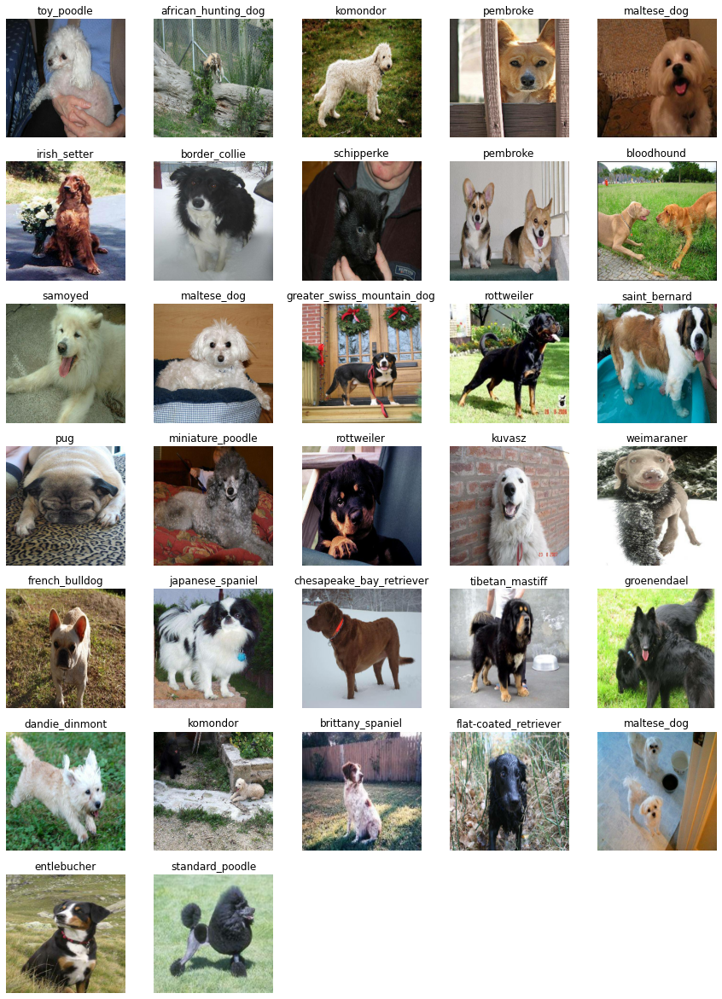

In [ ]:
images, labels = next(train_data.as_numpy_iterator())
plot_images_from_batch(images, labels)

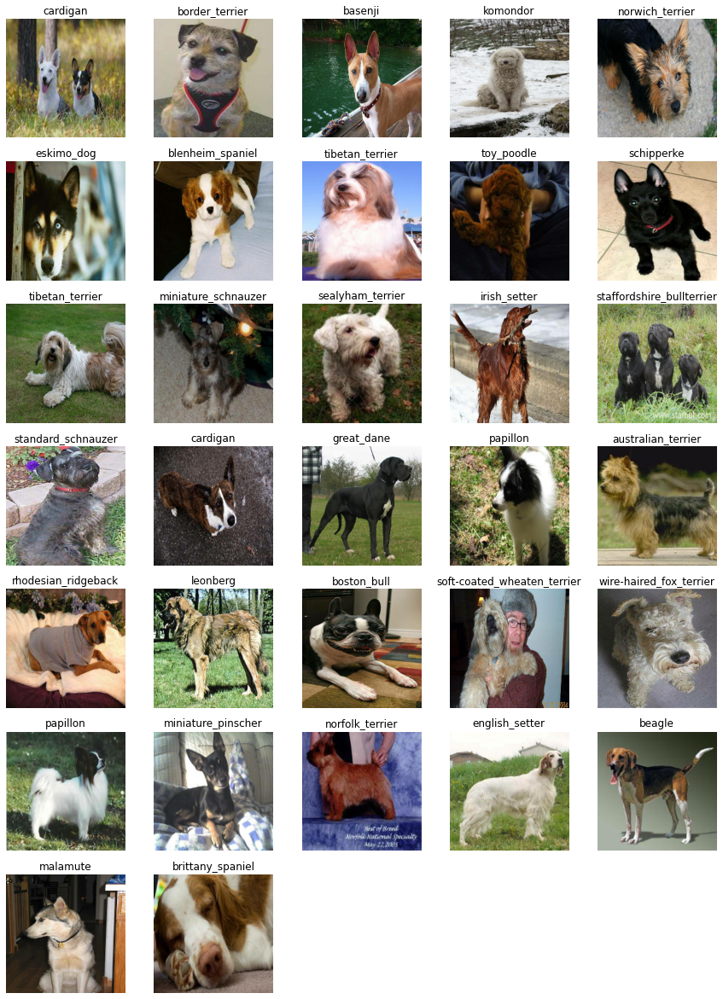

In [ ]:
images, labels = next(train_data.as_numpy_iterator())
plot_images_from_batch(images, labels)

# 3. Khởi tạo và train mô hình 

Khi dữ liệu đã được chuẩn bị, thời điểm thích hợp để khởi tạo và train mô hình đã tới. 

Trong phần này, chúng ta sẽ sử dụng 2 mô hình đã được train trước đó để cho chúng học dữ liệu và tiến hành kiểm định thay vì phải tự xây dựng lại mô hình từ ban đầu. 

> 🔑 **Lưu ý** : Trước khi bắt đầu giải quyết một vấn đề gì đó, bạn nên đặt câu hỏi rằng vấn đề đó đã có người giải quyết chưa? nếu đã có người giải quyết rồi, bạn nên tham khảo cách thức giải quyết của họ trước khi nghĩ đến việc sẽ tự giải quyết vấn đề đó. Trong machine learning cũng vậy, vấn đề mà bạn đã và đang muốn xây dựng mô hình có thể đã có người hoặc tổ chức nào đó đã làm trước đó rồi, bạn nên tham khảo mô hình của họ. 

Chúng ta sẽ sử dụng một mô đã được xây dựng trước đó từ [TensorFlow Hub](https://tfhub.dev/).

TensorFlow Hub là một mã nguồn mở, nơi bạn có thể tìm thấy các mô hình học máy đã được train trước đó cho vấn đề bạn đang giải quyết.

Sử dụng mô hình học máy được train trước thường được gọi là **Transfer learning**.

> 🔑 Tại sao lại phải sử dụng mô hình đã được train trước đó? 

+ Việc xây dựng một mô hình học máy và train nó từ đầu có thể tốn kém và mất thời gian.
+ Transfer learning giúp cải thiện một số điều này bằng cách lấy những gì mô hình khác đã học và sử dụng thông tin đó cho vấn đề của riêng bạn.

> 🔑 Làm cách nào để chúng ta có thể chọn một mô hình phù hợp? 

Chúng ta cần xác định vấn đề đang cần giải quyết, sau đó tìm top những mô hình đang có được tỉ lệ cao từ [paperwithcode](https://paperswithcode.com/) 

Bài viết này sẽ giới thiệu đến bạn 2 kiến trúc mô hình transfer learning: 
+ 1. Xây dựng mô hình `ResnetV50`
+ 2. Xây dựng mô hình `EfficientnetB0`

Để tải mô hình transfer learning, bạn có thể tìm kiếm trên [image classification](https://tfhub.dev/s?module-type=image-classification). hoặc sử dụng API của tensorflow `tf.keras.applications.[tên mô hình]`(bài viết này sẽ sử dụng API)

Trước khi xây dựng một mô hình, có một số điều chúng ta cần xác định:

+ Hình dạng input (hình ảnh, ở dạng Tensors) cho mô hình của.
+ Hình dạng output (label của hình ảnh, ở dạng Tensors) cho mô hình






In [ ]:
INPUT_SHAPE = (224,224,3)
OUTPUT_SHAPE = len(class_names)

Định nghĩa một mô hình Deep Learning trong Keras có thể đơn giản như nói, "đây là các layer của mô hình, hình input và hình dạng output, chúng ta hãy bắt đầu!"

Vì chúng ta sẽ xây dựng 2 mô hình hoặc bạn có thể xây dựng thêm, nên để có thể tái khởi tạo mô hình nhiều lần, chúng ta sẽ tạo hàm có thể sử dụng được nhiều lần có tên là `create_model()`. 

+ Hàm này gồm các tham số sau : 
  + input_shape : Hình dạng input của dữ liệu 
  + output_shape : Hình dạng output của mô hình
  + base_model : mô hình đã được train trước đó
  + norm (bool) mặc định là `False` : có chuẩn hóa dữ liệu hay không. Tùy vào từng mô hình, với `base_model` là EfficientB0 thì trong nó của nó đã có sẵn môt layer để scale dữ liệu, còn ResnetV50 thì không nên cần phải scale dữ liệu cho mô hình này.

+ Vai trò của hàm này : 
  + Khởi tạo mô hình 
    + Định nghĩa inputs layer với hình dạng của input.
    + Khởi tạo mô hình với mô hình cơ sở `base_model` làm một layer. 
    + Định nghĩa outputs layer với số lượng output được mô hình trả về. 
    + Định nghĩa mô hình với inputs và outputs trên 
  + Biên dịch mô hình : 
    + Loss function : Mục đích của loss function là để tính toán số lượng mà một mô hình nên tìm cách giảm thiểu trong quá trình train.
    + Optimizer : Trình tối ưu hóa là một trong hai tham số cần thiết để biên dịch mô hình Keras. Nó thay đổi hiệu quả của quá trình học của mô hình. 
    + Metrics : là một dụng cụ để đo lường hiệu suất của mô hình của bạn.
  + Build mô hình : 
    + cho nó biết hình dạng input mà nó sẽ nhận được. 
  + Return mô hình



In [ ]:
def create_model(input_shape, output_shape, base_model, norm=False) : 
  inputs = layers.Input(input_shape)
  if norm : 
    x = layers.Rescaling(scale=1/255.)(inputs)
  else : 
    x = inputs 
  x = base_model(x, training=False)
  x = layers.GlobalAveragePooling2D()(x)
  x = layers.Dense(output_shape)(x)
  outputs = layers.Activation("softmax")(x) 
  model = Model(inputs, outputs)

  model.compile(
      loss="categorical_crossentropy",
      optimizer="adam", 
      metrics=["accuracy"]
  )

  model.build(input_shape)
  return model

###  Giới thiệu về các hàm callback giám sát mô hình train

Trước khi tạo mô hình, chúng ta sẽ sử dụng một số callback function để thực hiện giám sát quá và dừng mô hình khi nó không còn cải thiện trong trình học của mô hình.






#### Tensorboard Callback

[TensorBoard](https://www.tensorflow.org/tensorboard/get_started) giúp cung cấp một cách trực quan để theo dõi tiến trình trong mô hình của bạn trong và sau khi train. 
Nó có thể được sử dụng trực tiếp ngay trên [notebook](https://www.tensorflow.org/tensorboard/tensorboard_in_notebooks) để theo dõi các phép đo lường về hiệu suất của một mô hình như `loss` và `accuracy`.

Để thiết lập Tensorboard callback, chúng ta cần : 
+ Load Tensorboard notebook extension
+ Tạo tensorboard callback để save logs đến đường dẫn và đưa nó vào tham số callbacks trong mô hình khi gọi phương thức `fit()`.
+ Quan sát nhật ký train của mô hình bằng cách sử dụng `%tensorboard` (phần này sẽ làm sau cùng) 

In [ ]:
%load_ext tensorboard

In [ ]:
import datetime 
def create_tensorboard_callback(dir_name, experiment_name) : 
  log_dir = os.path.join(dir_name, experiment_name, datetime.datetime.now().strftime("%d%m%Y-%H%M%S"))
  tensorboard_cb = tf.keras.callbacks.TensorBoard(log_dir)
  print(f"Đã lưu tensorboard vào {log_dir}")
  return tensorboard_cb


#### ModelCheckpoint Callback

Callback function tiếp theo sẽ là `ModelCheckpoint`, nó có tác dụng giám sát quá trình học của mô hình qua mỗi epoch (mặc định) hoặc có thể thay đổi theo nhu cầu của mỗi người, trong `ModelCheckpoint` có các tham số sau : 
+ `path_dir` : Đường dẫn để lưu model_checkpoint lại 
+ `monitor` (mặc định `val_loss`) : giám sát quá trình train của mô hình dựa trên phương pháp đo lường (có thể thay bằng `val_accuracy`)
+ `save_best_only` (mặc định là `False`) : Chỉ lưu mô hình có `val_loss` hoặc `val_accuracy` tốt nhất. 
+ `save_weight_only` : Lưu các trọng số tốt nhất của mô hình đưa trên `val_loss` hoặc `val_accuracy`.  

In [ ]:
model_checkpoint_resnet = "model_checkpoints/resnet.ckpt"
model_checkpoint_efficient = "model_checkpoints/efficient.ckpt"
def create_model_checkpoint(checkpoint_path) : 
  return tf.keras.callbacks.ModelCheckpoint(checkpoint_path,
                                            monitor="val_accuracy",
                                            save_best_only=True,
                                            save_weights_only=True,
                                            verbose=1
                                          )

#### Early Stopping Callback


> 🤔 Mô hình nên được train bao lâu, bao nhiêu epochs?

Rất khó có thể biết được khi nào mô hình học dữ liệu không thể cải thiện thêm được nữa, nếu chúng ta để thời gian train quá ngắn sẽ làm cho mô hình mất đi cơ hội để cải thiện khả năng dự đoán chính xác của nó. Nhưng nếu để train quá lâu, mô hình đến một thời điểm nào đó không còn khả năng cải thiện nữa thì sẽ dẫn đến lãng phí thời gian cũng như dễ gây ra hiện tượng `overfitting` cho mô hình. 

Vì vậy, một giải pháp tốt là chúng ta sẽ để mô hình train theo thời gian tùy ý (số epoch tùy ý), có thể 100 epoch, thậm chí lớn hơn. Sau đó, khi mô hình không có khả năng cải thiện, mô hình sẽ tự động ngắt không train nữa. Và để giúp quy trình này có thể thực hiện như vậy, `EarlyStopping Callback` chính là sự lựa chọn. 

Trong `EarlyStopping Callback` có tham số : 
+ `patience` : Số lần mô hình không cải thiện ở epoch này so với epoch trước. VD: `patience = 5` nghĩa là nếu 5 lần epoch lần này không cải thiện hoặc thậm chí còn tệ hơn epoch trước thì mô hình sẽ lập tức ngắt không train nữa. 

```
# Định dạng của đoạn này là mã
```



In [ ]:
early_stopping_cb = tf.keras.callbacks.EarlyStopping(monitor="val_loss",
                                                     patience=3,
                                                     verbose=1)

 Trước khi bắt đầu khởi tạo và train mô hình, bạn cần kiểm tra xem Google Colab đã kết nối với GPU chưa

In [ ]:
!nvidia-smi -L

GPU 0: Tesla K80 (UUID: GPU-b6ea57a2-0113-96a5-d1e3-748853ce9bec)


Chúng ta sẽ build 2 mô hình là `ResNetV50` và `EfficientNetB0` từ API trong Keras đế so sánh hiệu năng hoạt động của chúng. Và chúng ta sẽ sử dụng các trọng số  (weights) đã train trước đó của mô hình để train trên dữ liệu của chúng ta. Do đó, để cố định chúng thì cần thiết lập thuộc tính `trainable` của mô hình là `False`. 

> ⚠️  Vì bộ nhớ RAM trong Colab chỉ 12GB, rất có thể không đáp ứng được toàn bộ dữ liệu, mô hình train, và quá trình xử lý sau đó, nên bạn hãy lưu lại mô hình trong Driver để có thể load lại mô hình phòng trường hợp Colab sẽ ngắt bất cứ lúc nào. 



In [ ]:
from tensorflow.keras import Model, Sequential, layers

### Xây dựng mô hình ResnetV50 trích xuất đặc trưng

Trước tiên, chúng ta sẽ khởi tạo và train với mô hình `ResnetV50`

In [ ]:
resnet_base_model = tf.keras.applications.ResNet50V2(include_top=False)
resnet_base_model.trainable=False

In [ ]:
resnet_model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, resnet_base_model, norm=True)
resnet_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_6 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
rescaling_3 (Rescaling)      (None, 224, 224, 3)       0         
_________________________________________________________________
resnet50v2 (Functional)      (None, None, None, 2048)  23564800  
_________________________________________________________________
global_average_pooling2d_1 ( (None, 2048)              0         
_________________________________________________________________
dense_1 (Dense)              (None, 120)               245880    
_________________________________________________________________
activation_1 (Activation)    (None, 120)               0         
Total params: 23,810,680
Trainable params: 245,880
Non-trainable params: 23,564,800
_________________________________________

In [ ]:
resnet_model_history = resnet_model.fit(
    train_data,
    steps_per_epoch=len(train_data), 
    epochs=5, 
    validation_data=valid_data, 
    validation_steps=len(valid_data), 
    callbacks=[
              create_tensorboard_callback("dog_breed", "resnet_model_feature_extraction"), 
              create_model_checkpoint(model_checkpoint_resnet)
    ]
)

Đã lưu tensorboard vào dog_breed/resnet_model_feature_extraction/18092021-021445
Epoch 1/5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


256/256 [==============================] - 121s 285ms/step - loss: 1.7753 - accuracy: 0.5561 - val_loss: 1.1180 - val_accuracy: 0.6758

Epoch 00001: val_accuracy improved from -inf to 0.67579, saving model to model_checkpoints/resnet.ckpt
Epoch 2/5
256/256 [==============================] - 83s 275ms/step - loss: 0.6020 - accuracy: 0.8234 - val_loss: 1.1132 - val_accuracy: 0.6861

Epoch 00002: val_accuracy improved from 0.67579 to 0.68606, saving model to model_checkpoints/resnet.ckpt
Epoch 3/5
256/256 [==============================] - 83s 274ms/step - loss: 0.3452 - accuracy: 0.9006 - val_loss: 1.0820 - val_accuracy: 0.7046

Epoch 00003: val_accuracy improved from 0.68606 to 0.70465, saving model to model_checkpoints/resnet.ckpt
Epoch 4/5
256/256 [==============================] - 83s 274ms/step - loss: 0.2138 - accuracy: 0.9501 - val_loss: 1.1035 - val_accuracy: 0.7081

Epoch 00004: val_accuracy improved from 0.70465 to 0.70807, saving model to model_checkpoints/resnet.ckpt
Epoch 5/

In [ ]:
from utility_functions import plot_loss_curves

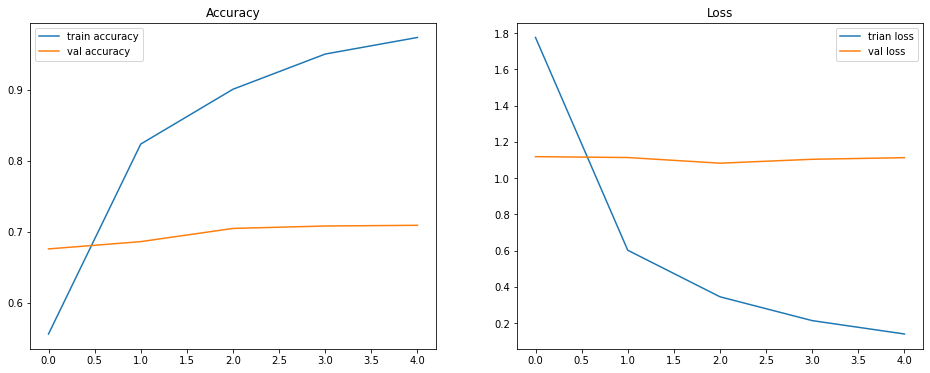

In [ ]:
plot_loss_curves(resnet_model_history)

Tiếp theo, khởi tạo và train mô hình `EfficientNetB0`

### Xây dựng mô hình EfficientNetB0 trích xuất đặc trưng

In [ ]:
efficientb0_base_model = tf.keras.applications.EfficientNetB0(include_top=False)
efficientb0_base_model.trainable=False

In [ ]:
efficientnet_model = create_model(INPUT_SHAPE, OUTPUT_SHAPE, efficientb0_base_model, norm=False)
efficientnet_model.summary()

Model: "model_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_7 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
efficientnetb0 (Functional)  (None, None, None, 1280)  4049571   
_________________________________________________________________
global_average_pooling2d_2 ( (None, 1280)              0         
_________________________________________________________________
dense_2 (Dense)              (None, 120)               153720    
_________________________________________________________________
activation_2 (Activation)    (None, 120)               0         
Total params: 4,203,291
Trainable params: 153,720
Non-trainable params: 4,049,571
_________________________________________________________________


In [ ]:
efficientnet_model_history = efficientnet_model.fit(
    train_data,
    steps_per_epoch=len(train_data), 
    epochs=5, 
    validation_data=valid_data, 
    validation_steps=len(valid_data), 
    callbacks=[
              create_tensorboard_callback("dog_breed", "resnet_model_feature_extraction"), 
              create_model_checkpoint(model_checkpoint_efficient)
    ]
)

Đã lưu tensorboard vào dog_breed/resnet_model_feature_extraction/18092021-022320
Epoch 1/5


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


256/256 [==============================] - 62s 168ms/step - loss: 1.7942 - accuracy: 0.6397 - val_loss: 0.8405 - val_accuracy: 0.7985

Epoch 00001: val_accuracy improved from -inf to 0.79853, saving model to model_checkpoints/efficient.ckpt
Epoch 2/5
256/256 [==============================] - 55s 166ms/step - loss: 0.5927 - accuracy: 0.8568 - val_loss: 0.6637 - val_accuracy: 0.8156

Epoch 00002: val_accuracy improved from 0.79853 to 0.81565, saving model to model_checkpoints/efficient.ckpt
Epoch 3/5
256/256 [==============================] - 55s 166ms/step - loss: 0.4070 - accuracy: 0.9039 - val_loss: 0.6107 - val_accuracy: 0.8200

Epoch 00003: val_accuracy improved from 0.81565 to 0.82005, saving model to model_checkpoints/efficient.ckpt
Epoch 4/5
256/256 [==============================] - 54s 166ms/step - loss: 0.3082 - accuracy: 0.9338 - val_loss: 0.5805 - val_accuracy: 0.8274

Epoch 00004: val_accuracy improved from 0.82005 to 0.82738, saving model to model_checkpoints/efficient.ck

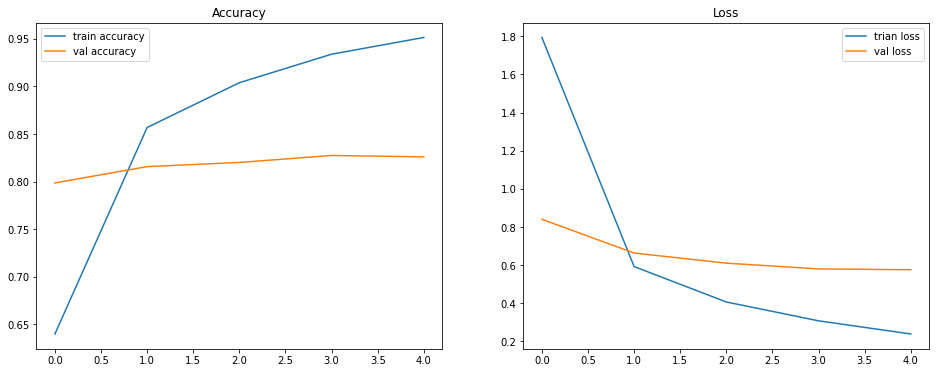

In [ ]:
plot_loss_curves(efficientnet_model_history)

Có thể thấy hiệu năng học dữ liệu từ 2 mô hình khá tương đồng với nhau, `training accuracy` đạt > 90%, `training loss` đều < 2. Tuy nhiên, đến quá trình kiểm định mô hình, có thể thấy rõ sự chênh lệch giữa chúng. 
`val accuracy` của  `EfficientNetB0` đạt độ chính xác > 80%, trong khi `val accuracy` của `ResnetV50` chỉ đạt ~70%. Có thể khẳng định mô hình được train với `EfficientNetB0` đạt hiệu năng tốt hơn rất nhiều so với `ResnetV50` trong quá trình kiểm định dữ liệu chưa mà mô hình chưa từng biết đến. 

### Tinh chỉnh mô hình trích xuất đặc trưng.

Mô hình `EfficientB0` là mô hình tốt hơn, vì thế chúng ta sẽ cố gắng cải thiện để xem mô hình bằng cách cho phép một số layer con trong layer `efficientnetb0` của mô hình `efficientnet_model` được phép train như sau :


Đầu tiên chúng ta sẽ kiểm tra các layer trong `efficientnet_model`:

In [ ]:
for layer in efficientnet_model.layers : 
  print(layer.name, layer.trainable)

input_7 True
efficientnetb0 False
global_average_pooling2d_2 True
dense_2 True
activation_2 True


Có thể thấy tất cả các layer đều được phép train là các layer mà chúng ta định nghĩa, còn layer `efficientnetb0` là `False` vì trước đó chúng ta đã sử dụng set thuộc tính `trainable=False`. 

Tiếp theo, kiểm tra các layer con trong layer `efficientnetb0`: 

In [ ]:
for layer in efficientnet_model.layers[1].layers: 
  print(layer.name, layer.trainable)

input_5 False
rescaling_2 False
normalization_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False
block1a_activation False
block1a_se_squeeze False
block1a_se_reshape False
block1a_se_reduce False
block1a_se_expand False
block1a_se_excite False
block1a_project_conv False
block1a_project_bn False
block2a_expand_conv False
block2a_expand_bn False
block2a_expand_activation False
block2a_dwconv_pad False
block2a_dwconv False
block2a_bn False
block2a_activation False
block2a_se_squeeze False
block2a_se_reshape False
block2a_se_reduce False
block2a_se_expand False
block2a_se_excite False
block2a_project_conv False
block2a_project_bn False
block2b_expand_conv False
block2b_expand_bn False
block2b_expand_activation False
block2b_dwconv False
block2b_bn False
block2b_activation False
block2b_se_squeeze False
block2b_se_reshape False
block2b_se_reduce False
block2b_se_expand False
block2b_se_excite False
block2b_project_conv False

OK, tất cả các layer con đều được cố định, không được phép train. Bây giờ là bước tinh chỉnh mô hình, hay có thể hiểu là cho phép một số hoặc tất cả layer trong mô hình cơ sở `efficientnetb0` được phép train. Vì dữ liệu train không quá lớn (>8000), chúng ta sẽ chỉ cho một số layer được train, cụ thể trong trường hợp này là 5 layer cuối cùng (trên cùng, gần với output layer nhất). 

> 🔑 **Lưu ý:** Tinh chỉnh mô hình trích xuất đặc trưng nghĩa là cho các layer trong mô hình đã được train trước đó được phép train lại trên dữ liệu hiện tại. Bạn có thể cho phép train một vài layer hoặc tất cả layer tùy thuộc vào dữ liệu, kích thước của chúng.  Nếu dữ liệu bạn có rất nhiều thì nên cho nhiều layer có thể train, nhưng nếu quá ít như trường hợp này thì chỉ nên cho một vài layer được train. Nếu dữ liệu ít nhưng bạn lại cho nhiều layer train sẽ làm giảm hiệu năng của mô hình vì nó sẽ phá bỏ các trọng số đã được train trước đó để train lại dự liệu của bạn, mà càng ít dữ liệu thì nó sẽ học không được nhiều. 

In [ ]:
for layer in efficientnet_model.layers[1].layers[-5:] : 
  layer.trainable=True

In [ ]:
for layer in efficientnet_model.layers[1].layers: 
  print(layer.name, layer.trainable)

input_5 False
rescaling_2 False
normalization_1 False
stem_conv_pad False
stem_conv False
stem_bn False
stem_activation False
block1a_dwconv False
block1a_bn False
block1a_activation False
block1a_se_squeeze False
block1a_se_reshape False
block1a_se_reduce False
block1a_se_expand False
block1a_se_excite False
block1a_project_conv False
block1a_project_bn False
block2a_expand_conv False
block2a_expand_bn False
block2a_expand_activation False
block2a_dwconv_pad False
block2a_dwconv False
block2a_bn False
block2a_activation False
block2a_se_squeeze False
block2a_se_reshape False
block2a_se_reduce False
block2a_se_expand False
block2a_se_excite False
block2a_project_conv False
block2a_project_bn False
block2b_expand_conv False
block2b_expand_bn False
block2b_expand_activation False
block2b_dwconv False
block2b_bn False
block2b_activation False
block2b_se_squeeze False
block2b_se_reshape False
block2b_se_reduce False
block2b_se_expand False
block2b_se_excite False
block2b_project_conv False

5 layer cuối cùng của `efficientnetb0` đã được phép train lai. Bây giờ sẽ biên dich lại mô hình.

> 🔑 **Lưu ý:** Trong mô hình, nếu có bất kỳ một sự điều chỉnh nào, dù là nhỏ nhất, chúng ta cần phải biên dịch (compile) trước khi tiến hành cho mô hình train dữ liệu (`fit`). 

In [ ]:
efficientnet_model.compile(
    loss="categorical_crossentropy" ,
    optimizer=tf.keras.optimizers.Adam(learning_rate=0.0001),
    metrics=["accuracy"]
)

Vì lúc này chúng ta sẽ cho mô hình train trong một thời gian dại (epoch lớn), qua mỗi chu kỳ train (epoch) mô hình sẽ tiếp thu được ngày càng ít kiến thức hơn so với ban đầu. Nên về sau nếu mô hình cứ học với tốc độ như lúc đầu sẽ rất khó để kiếm những đặc trưng ít ỏi nằm sâu trong dữ liệu đó. Do đó, khi thấy mô hình cải thiện ít hoặc không cải thiện, chúng ta sẽ điều chỉnh tốc độ học của mô hình chậm lại, để nó học kỹ hơn dữ liệu đó.

Để làm được điều đó, chúng ta sẽ sử dụng một callback function tên là `ReduceLROnPlateau` để làm giảm `learning_rate` nếu mô hình cải thiện kém trong khả năng `val_loss` hoặc `val_accuracy`. 

In [ ]:
reduce_lr = tf.keras.callbacks.ReduceLROnPlateau(monitor="val_loss", # phương pháp giam sát hiệu năng của so với epoch trước để quyết định có nên giảm learning rate hay không
                                                 factor=0.2, # giảm bao nhiêu lần so với learning rate trước đó
                                                 patience=10, # Sau bao nhiêu lần không cải thiện sẽ giảm leanring rate
                                                 verbose=1,
                                                 min_lr=1e-6) #  learning rate tối thiểu không được phép giảm nữa

In [ ]:
efficientnet_model_fine_tune_history = efficientnet_model.fit(
    train_data,
    steps_per_epoch=len(train_data),
    epochs=100, 
    initial_epoch=efficientnet_model_history.epoch[-1], 
    validation_data=valid_data, 
    validation_steps=len(valid_data), 
    callbacks=[
              create_tensorboard_callback("dog_breed", "efficientnet_fine_tune"), 
              tf.keras.callbacks.ModelCheckpoint(filepath="model_checkpoints/efficientb0_fine_tune", 
                                                 monitor="val_loss", 
                                                 save_best_model=True,
                                                 verbose=1), 
              reduce_lr, 
              early_stopping_cb
    ]
)

Đã lưu tensorboard vào dog_breed/efficientnet_fine_tune/18092021-022852
Epoch 5/100


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


256/256 [==============================] - 61s 165ms/step - loss: 0.1808 - accuracy: 0.9702 - val_loss: 0.5628 - val_accuracy: 0.8220

Epoch 00005: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 6/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1719 - accuracy: 0.9738 - val_loss: 0.5602 - val_accuracy: 0.8235

Epoch 00006: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 7/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1656 - accuracy: 0.9751 - val_loss: 0.5596 - val_accuracy: 0.8254

Epoch 00007: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 8/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1596 - accuracy: 0.9773 - val_loss: 0.5593 - val_accuracy: 0.8264

Epoch 00008: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 9/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1541 - accuracy: 0.9777 - val_loss: 0.5576 - val_accuracy: 0.8254

Epoch 00009: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 10/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1488 - accuracy: 0.9792 - val_loss: 0.5581 - val_accuracy: 0.8254

Epoch 00010: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 11/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1438 - accuracy: 0.9809 - val_loss: 0.5583 - val_accuracy: 0.8254

Epoch 00011: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 12/100
256/256 [==============================] - 55s 166ms/step - loss: 0.1390 - accuracy: 0.9820 - val_loss: 0.5578 - val_accuracy: 0.8264

Epoch 00012: saving model to model_checkpoints/efficientb0_fine_tune
INFO:tensorflow:Assets written to: model_checkpoints/efficientb0_fine_tune/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


Epoch 00012: early stopping


In [ ]:
from utility_functions import  compare_history

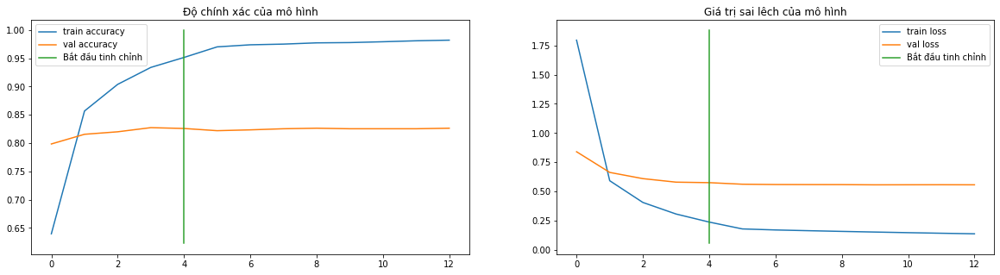

In [ ]:
compare_history(efficientnet_model_history, efficientnet_model_fine_tune_history)

#### Đánh giá mô hình tinh chỉnh

In [ ]:
result_efficient_model_fine_tune = efficientnet_model.evaluate(valid_data)
result_efficient_model_fine_tune

64/64 [==============================] - 8s 120ms/step - loss: 0.5578 - accuracy: 0.8264


[0.5578241348266602, 0.8264058828353882]

#### Lưu mô hình 

In [ ]:
save_dir = "/content/drive/MyDrive/transfer_learning/dog_breed_model"

In [ ]:
efficientnet_model.save(save_dir)

INFO:tensorflow:Assets written to: /content/drive/MyDrive/transfer_learning/dog_breed_model/assets


/usr/local/lib/python3.7/dist-packages/keras/utils/generic_utils.py:497: CustomMaskWarning: Custom mask layers require a config and must override get_config. When loading, the custom mask layer must be passed to the custom_objects argument.
  category=CustomMaskWarning)


## Đánh giá và dự đoán mô hình trên dữ liệu kiểm địn

Trước tiên chúng ta sẽ load lai mô hình tốt nhất đã được lưu ở phần trên

In [ ]:
loaded_model = tf.keras.models.load_model(save_dir)

### Đánh giá mô hình kiểm định

In [ ]:
result_loaded_model = loaded_model.evaluate(valid_data)
result_loaded_model

64/64 [==============================] - 40s 131ms/step - loss: 0.5578 - accuracy: 0.8264


[0.5578241348266602, 0.8264058828353882]

### Dự đoán mô hình từ dữ liệu kiểm định

Mô hình có khả năng dự đoán chính xác đến >82% trên dữ liệu kiểm định (valid_data). Chúng ta sẽ tiến hành dự đoán của dữ liệu kiểm định này.

In [ ]:
y_pred_probs = loaded_model.predict(valid_data,verbose=1)
y_pred_probs

64/64 [==============================] - 9s 107ms/step


array([[6.5913167e-07, 1.1576774e-06, 3.4290874e-06, ..., 4.4346267e-05,
        1.2099714e-04, 7.5360936e-06],
       [1.5267351e-05, 1.2430275e-03, 7.7208351e-06, ..., 6.8555386e-07,
        6.8753314e-09, 9.0866801e-05],
       [6.1690498e-06, 1.2055059e-03, 5.3473159e-06, ..., 2.6101031e-04,
        1.6322512e-05, 9.0042965e-07],
       ...,
       [7.4642890e-07, 2.6508731e-05, 4.0508489e-06, ..., 5.9246922e-08,
        1.4373866e-07, 8.6109121e-06],
       [1.2227687e-08, 7.9480897e-06, 1.6391324e-07, ..., 8.1840831e-08,
        2.4569371e-08, 1.8823050e-08],
       [2.6653557e-05, 8.2158255e-07, 1.4097719e-05, ..., 3.1437924e-07,
        2.4546750e-07, 1.3475732e-06]], dtype=float32)

In [ ]:
print(y_pred_probs[0])
print(f"Max value (probability of prediction): {np.max(y_pred_probs[0])}") # the max probability value predicted by the model
print(f"Sum: {np.sum(y_pred_probs[0])}") # because we used softmax activation in our model, this will be close to 1
print(f"Max index: {np.argmax(y_pred_probs[0])}") # the index of where the max value in y_pred_probs[0] occurs
print(f"Predicted label: {class_names[np.argmax(y_pred_probs[0])]}") # the predicted label

[6.59131672e-07 1.15767739e-06 3.42908743e-06 1.34482616e-06
 2.72144393e-06 2.24939873e-03 2.05446649e-05 4.08853078e-03
 4.59479601e-08 1.23227255e-05 1.21699777e-05 7.92457513e-07
 1.35807604e-05 1.13655017e-06 1.35270781e-07 2.36507331e-05
 8.28607426e-06 2.83578925e-06 3.55027532e-06 4.27549821e-04
 7.71246334e-07 2.39637728e-07 1.09740422e-05 3.83496968e-07
 7.51108109e-06 4.73344215e-07 4.23187475e-06 1.91630592e-04
 2.71264554e-07 1.41822090e-02 9.09239688e-08 1.12810767e-06
 4.62244110e-08 4.77692993e-06 6.86475744e-07 1.00719842e-06
 4.71708699e-06 1.93983607e-04 6.79521705e-04 4.08069491e-06
 1.43510442e-06 7.95306505e-07 9.10500967e-05 5.22384216e-05
 2.46401271e-07 2.32510979e-06 1.18959879e-05 1.36721883e-06
 3.84785039e-07 9.76687033e-07 9.20587718e-06 1.26313773e-06
 1.84009650e-07 2.80832883e-05 1.80097197e-06 7.94137886e-05
 6.76853347e-07 4.23452917e-07 1.00959005e-06 2.99948226e-07
 2.08447949e-04 3.97579743e-06 3.34251240e-07 3.90628679e-03
 7.60221474e-06 1.239642

`y_pred_probs` là một mảng gồm 2045 phần tử đại diện cho 2045 hình ảnh, mỗi phần tử trong mảng lớn này lại là một mảng gồm 120 phần tử đại diện cho 120 class, và mỗi vị trí trong 120 phần tử này thể hiện xác suất có thể xảy ra cho class đó. Chúng ta sẽ lấy vị trí nào mà phần tử có giá trị lớn nhất trong mảng con làm đại diện dự đoán cho dữ liệu hình ảnh đó.

In [ ]:
y_pred_labels = tf.argmax(y_pred_probs,axis=1).numpy()
y_pred_labels

array([111,  56,  97, ...,  49,  49,  91])

Trước đây, label của chúng ta được biểu diễn dưới dạng mảng gồm 120 phần tử, nên bây giơ cũng làm tương tự như trên, lấy vị trí nào có giá trị lớn nhất làm vị trí đại diện cho dữ liệu hình ảnh đó. 

In [ ]:
y_true_labels = tf.argmax(y_valid, axis=1).numpy()
y_true_labels

array([111,  56,  97, ...,  56,  49,  67])

Để đánh giá mô hình phân loại, có khá nhiều phương pháp. Chúng ta sẽ sử dụng một số phương pháp phổ biến như `confusion_matrix`, `accuracy_score`, `classification_report`... Tất cả đều có sẵn trong `sklearn` hoặc `tf.metrics`. 

In [ ]:
from sklearn.metrics import confusion_matrix, accuracy_score

Ở phần Đánh giá mô hình kiểm định, bạn có thấy accuracy của nó là `0.8264` không, con số đó được tính bằng cách lấy số mẫu dự đoán đúng / tổng số mẫu. 

Có thể thực hiện bằng phương pháp `accuracy_score` :

In [ ]:
accuracy_score(y_true_labels, y_pred_labels)

0.8264058679706602

Độ chính xác `0.8264` chỉ là đánh giá tổng thể tất cả các dữ liệu trong mô hình. Nếu muốn biết cụ thể class nào dự đoán chính xác nhất, class nào dự đoán kém nhất, hoặc bạn muốn quan tâm khả năng dự đoán của một class nào đó thì bạn sẽ làm sao? 

`confusion_matrix` sẽ giúp bạn làm điều này, nhưng nếu để nó hiển thị dưới dạng ma trận thì sẽ không được trực quan. Do đó, trong `utility_function.py` đã xây dựng sẵn hàm biểu diễn `confusion_matrix` mà bạn có thể tận dụng lại đó là `plot_confusion_matrix()` , với các tham số: 

+ `true_labels` list : các label của dữ liệu thực
+ `pred_labels` list : các label của dữ liệu dự đoán
+ `class_names` list (mặc định `None`) : Danh sách các class_names nếu có (chúng ta có 120 giống chó đã được định nghĩa thành class_names ở phần `Khám phá dữ liệu`)
+ `norm` bool (mặc định `True`) : liệu có quy ra thành tỉ lệ dự đoán ở mỗi phần tử hay không. 

In [ ]:
from utility_functions import plot_confusion_matrix

Vì `class_names` đang thuộc kiểu `numpy.array`, cần phải ép thành kiểu list thì hàm này mới hoạt động được. 

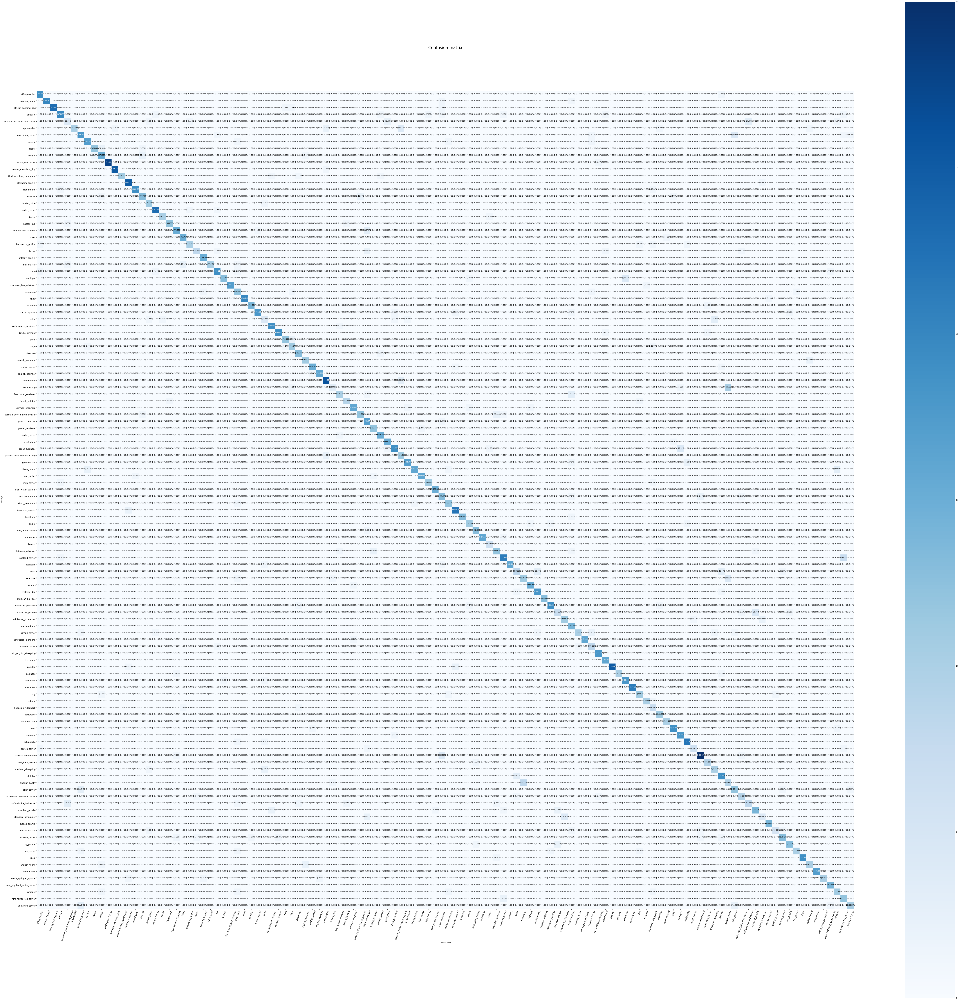

In [ ]:
plot_confusion_matrix(y_true_labels, y_pred_labels, list(class_names) )

Tiếp theo, chúng ta sẽ dự đoán hình ảnh ngẫu nhiên từ tập dữ liệu kiểm định. Vì khi đưa vào mô hình, tập dữ liệu kiểm định được phân thành nhiều cụm, nên bây giờ chúng ta sẽ phải đưa dữ liệu từ các cụm đó trở về với vị trí tuần tự như ban đầu. Đầu tiên chúng ta sẽ tạo một hàm tên là `unbatchify_data(data)`, sau đó tạo một biến kiểu list tên là `images` và `labels` để  qua mỗi vòng lặp sử dụng  phương thức `unbatch()` có thể đẩy dữ liệu đó vào trong list.  

In [ ]:
def unbatchify_data(data) : 
  images = []
  labels = []
  for image, label in data.unbatch() :    
    images.append(image)
    labels.append(tf.argmax(label))
  return images, labels
images, labels = unbatchify_data(valid_data)

Hàm `plot_pred_conf` sẽ giúp chúng ta tạo biểu đồ thể hiện những xác suất dự đoán tốt nhất cho một dữ liệu hình ảnh được dự đoán. Hàm này gồm các tham số : 
+ `pred_prob` list: mảng gồm 120 phần tử, mỗi phần tử  thể hiện xác suất của nó
+ `true_label` str (mặc định `None`) : Giá trị thực sự của dữ liệu hình ảnh nếu có,
+ `n` int (mặc định 10) : Top các giá trị dự đoán lớn nhất. 

In [ ]:
def plot_pred_conf(pred_prob, true_label=None, n=10) : 
  pred_prob = np.squeeze(pred_prob)
  top_n_pred_indices = np.argsort(pred_prob)[:-n:-1]
  top_n_pred_values = pred_prob[[top_n_pred_indices]]
  top_n_pred_labels = np.array(class_names)[[top_n_pred_indices]]
  top_plot = plt.bar(range(len(top_n_pred_values)),top_n_pred_values)
  plt.xticks(labels=top_n_pred_labels, ticks=range(n),rotation=90)  
  if true_label and np.isin(true_label, top_n_pred_labels) : 
    top_plot[np.argmax(top_n_pred_labels==true_label)].set_color("green")    
  else : 
    for plot_item in top_plot: 
      plot_item.set_color("gray")
  for plot_item in top_plot : 
    x,h = plot_item.get_x(), plot_item.get_height()
    plt.text(x,h, f"{h:.2f}", ha="left", va="bottom")

Mọi thứ đã sẵn sàng, chúng ta sẽ tạo hàm đê dự đoán dữ liệu hình ảnh ngẫu nhiên, cũng như biểu diễn dữ liệu đó thành hình ảnh và biểu đồ cột thống kê top những xác suất có khả năng xảy ra cao nhất.

In [ ]:
import random
import math

def plot_and_predict_random_images(model,images,labels=None, n_samples=1) : 
  random_image_indices = random.sample(range(len(images)), k=n_samples) 
  images = [ images[i] for i in random_image_indices]
  if labels : 
    labels = [labels[i] for i in random_image_indices] 
  n_cols = 2
  n_rows = math.ceil(n_samples/n_cols)
  fig, axes = plt.subplots(figsize=(n_cols*5*2, n_rows*5))  
  fig.tight_layout()
  for i in range(n_samples) : 
    image = images[i]
    label = None 
    if labels : 
      label = labels[i]
    pred_prob = model.predict(tf.expand_dims(image, axis=0))
    pred_label = tf.squeeze(tf.argmax(pred_prob,axis=1)).numpy()
    color = "black" 
    if label : 
      color = "red"
      if pred_label == label : 
        color = "green"
    
    plt.subplot(n_rows, n_cols*2, 2*i+1)
    plt.imshow(image/255.)
    plt.axis(False)
    if label :
      plt.title(f"Actual: {class_names[label]}\nPredict: {class_names[pred_label]}")
    else : 
       plt.title(f"Predict: {class_names[pred_label]}")
    plt.subplot(n_rows, n_cols*2, 2*i+2)   
    if label :   
      plot_pred_conf(pred_prob, class_names[label])
    else : 
      plot_pred_conf(pred_prob)


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """


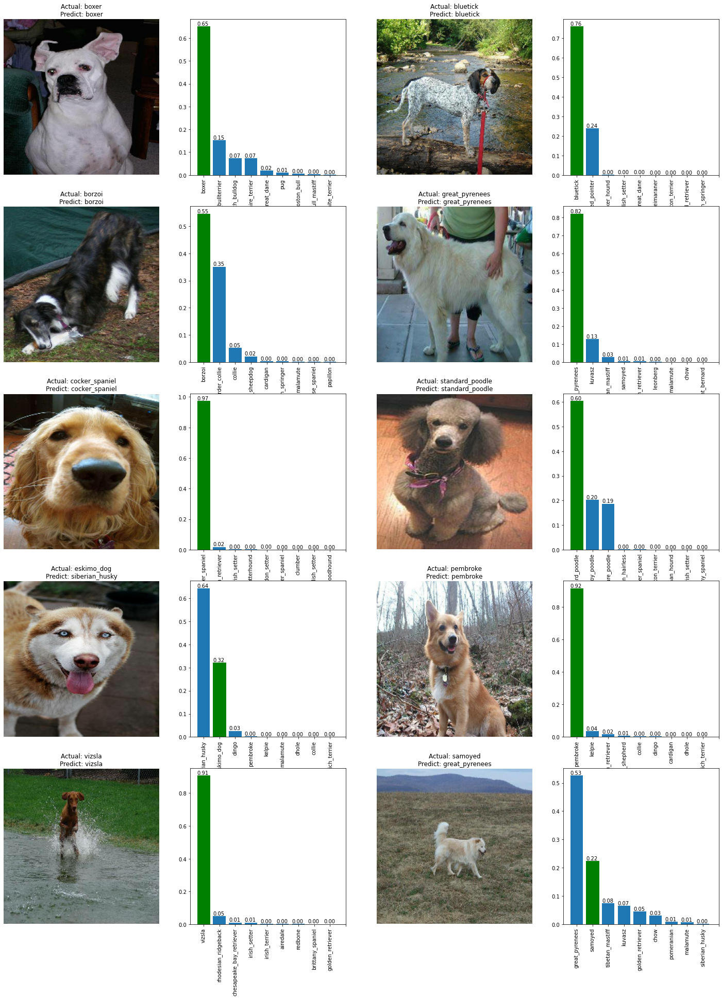

In [ ]:
plot_and_predict_random_images(loaded_model, images, labels, 10)


Chúng ta có thể dễ dàng đánh giá được kết quả dự đoán qua biểu đồ cùng với hình ảnh trực quan. Vì dữ liệu kiểm định `valid_data` của chúng ta có sẵn `label` nên có thể dễ dạng đánh giá.

Bây giờ, chúng ta sẽ sử dụng mô hình để dự đoán với dữ liệu `test`.



## 6. Mô hình dự đoán dữ liệu test.

Tạo đường dẫn liên kết đến tập dữ liệu `test`.

In [ ]:
test_dir = "dog-breed-identification/test"

Khám phá dữ liệu `test`

In [ ]:
walk_through_directory(test_dir)

Có 0 thư mục và 10357 tập tin trong thư mục dog-breed-identification/test


Tạo list đường dẫn đến các file ảnh trong dữ liệu `test`

In [ ]:
test_image_paths = [] 
for image_name in os.listdir(test_dir) : 
  test_image_paths.append(os.path.join(test_dir, image_name))
test_image_paths[:10]

['dog-breed-identification/test/719c20e68567910305db04be473df3cb.jpg',
 'dog-breed-identification/test/8db6b8f62434b16f4c83a6b807a322ff.jpg',
 'dog-breed-identification/test/380dd7b2b1c76c3c91a65b4b35d1f0ea.jpg',
 'dog-breed-identification/test/97b6a6178a31ed3c4c5e67bb4dcc7a9c.jpg',
 'dog-breed-identification/test/27a5ccc9944d0a7081814a481a02a880.jpg',
 'dog-breed-identification/test/5e193ae2c366405e230a53daa4fb7721.jpg',
 'dog-breed-identification/test/fd0a3ceca8806d5d63f72fb57c0a73c0.jpg',
 'dog-breed-identification/test/83b3a854863d6e7047bee089969663ff.jpg',
 'dog-breed-identification/test/bd4211cd31953f8ada0a80791a37cf73.jpg',
 'dog-breed-identification/test/b3bdba23a9105fe502fc2b661f215cd8.jpg']

Để mô hình có thể dự đoán được dữ liệu thì dữ liệu đó phải có hình dạng tương đồng với dữ liệu mà mô hình đó train. Vì trước đó, dữ liệu `train_data` và `valid_data` được đều được tiền xử lý hình ảnh kèm theo label và sau đó đưa vào thành từng cụm để mô hình train, cho nên `test_data` cũng cần phải đưa vào thành từng cụm nhưng không có label. Và hàm `create_data_batches()` sẽ giúp tiền xử lý dữ liệu và đưa chúng thành từng cụm

In [ ]:
test_data = create_data_batches(test_image_paths,test_data=True)
test_data

Đang xử lý và chuyển dữ liệu test thành từng cụm.
Đã xử lý xong! 💡


<BatchDataset shapes: (None, 224, 224, 3), types: tf.float32>

OK,`test_data` đã sẵn sàng, tiền hành dự đoán thôi!!!

In [ ]:
test_pred_probs = loaded_model.predict(test_data,verbose=1)
test_pred_probs[:2]

324/324 [==============================] - 36s 110ms/step


array([[1.20082404e-05, 2.10602389e-06, 1.61605885e-06, 1.05956786e-07,
        4.60974377e-07, 4.19297703e-06, 8.48665804e-05, 2.08828010e-06,
        3.37975052e-07, 1.07721180e-05, 7.19654878e-08, 8.37683820e-06,
        6.01606530e-07, 5.93004625e-05, 6.84161918e-08, 9.06419154e-06,
        3.48753092e-05, 3.04225836e-07, 1.95467987e-06, 2.20416114e-05,
        1.26650093e-06, 1.87098703e-06, 1.39390852e-06, 2.35815605e-06,
        2.94197434e-06, 5.99817653e-08, 5.76054276e-07, 9.96607741e-06,
        6.22795184e-08, 3.62645881e-03, 7.16077153e-08, 1.66921154e-06,
        4.13568614e-06, 4.98403642e-05, 3.23554701e-07, 1.25279485e-05,
        8.46533396e-07, 2.60950259e-07, 2.77999970e-06, 5.20468291e-07,
        1.81613325e-06, 8.63106322e-07, 2.97221577e-05, 5.46957017e-06,
        7.33472064e-07, 5.91608227e-07, 3.65616614e-07, 3.06098315e-07,
        5.16025906e-08, 1.07456401e-06, 3.51595190e-06, 5.62441187e-07,
        7.24773736e-06, 1.01187675e-06, 3.28457099e-06, 1.695864

Cũng tương tự như phần kiểm định mô hình, chúng ta sẽ có một mảng lớn là tập hợp của 10365 mảng con với 120 phần tử đại diện cho xác suất có thể xảy ra của mỗi class trong mảng. Chúng ta sẽ lấy vị trí mà phần tử có giá trị (xác suất) lớn nhất để làm đại diện dự đoán cho mảng con đó.



In [ ]:
test_pred_labels = tf.argmax(test_pred_probs,axis=1).numpy()
test_pred_labels

array([84, 32, 57, ..., 24, 42, 57])

Tạo bảng thống kê các giá trị dự đoán của mỗi hình ảnh trong dữ liệu `test` với `pd.DataFrame()`

In [ ]:
test_df = pd.DataFrame({
    "image_path" : test_image_paths,
    "conf_pred" : tf.reduce_max(test_pred_probs,axis=1).numpy(),
    "pred_label" : test_pred_labels, 
    "pred_name" : [class_names[pred_label] for pred_label in test_pred_labels]
})
test_df

,image_path,conf_pred,pred_label,pred_name
0,dog-breed-identification/test/719c20e685679103...,0.990463,84,papillon
1,dog-breed-identification/test/8db6b8f62434b16f...,0.985289,32,cocker_spaniel
2,dog-breed-identification/test/380dd7b2b1c76c3c...,0.993548,57,irish_terrier
3,dog-breed-identification/test/97b6a6178a31ed3c...,0.816491,94,samoyed
4,dog-breed-identification/test/27a5ccc9944d0a70...,0.643474,112,vizsla
...,...,...,...,...
10352,dog-breed-identification/test/9e8232b5e5ad1976...,0.407704,112,vizsla
10353,dog-breed-identification/test/ed63374c99282b30...,0.801641,28,chesapeake_bay_retriever
10354,dog-breed-identification/test/70284866addb982f...,0.981648,24,brittany_spaniel
10355,dog-breed-identification/test/c1bae285fa572caf...,0.980637,42,entlebucher


In [ ]:
test_images = []
for image in test_data.unbatch(): 
  test_images.append(image) 
test_images[:2]

[<tf.Tensor: shape=(224, 224, 3), dtype=float32, numpy=
 array([[[ 56.355072,  46.355072,  34.35507 ],
         [ 54.1413  ,  44.1413  ,  32.1413  ],
         [ 59.41837 ,  49.41837 ,  37.41837 ],
         ...,
         [ 52.363354,  44.363354,  33.363354],
         [ 58.97963 ,  50.97963 ,  39.97963 ],
         [ 52.437325,  44.437325,  33.437325]],
 
        [[ 59.370136,  49.370136,  37.370136],
         [ 58.548706,  48.548706,  36.548706],
         [ 47.53954 ,  37.53954 ,  25.53954 ],
         ...,
         [ 49.531364,  41.531364,  30.531364],
         [ 43.47749 ,  35.47749 ,  24.477488],
         [ 46.867878,  38.867878,  27.867878]],
 
        [[ 73.39285 ,  63.392853,  51.392853],
         [ 70.38907 ,  60.389065,  48.389065],
         [ 83.29858 ,  73.29858 ,  61.298576],
         ...,
         [ 59.10488 ,  51.10488 ,  40.10488 ],
         [ 57.49354 ,  49.49354 ,  38.49354 ],
         [ 61.76868 ,  53.76868 ,  42.76868 ]],
 
        ...,
 
        [[113.25203 , 101.25203 

Biểu diễn kết quả dự đoán bằng hình ảnh cũng như biểu đồ những class nào có xác suất xảy ra cao nhất

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:4: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  after removing the cwd from sys.path.
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  """


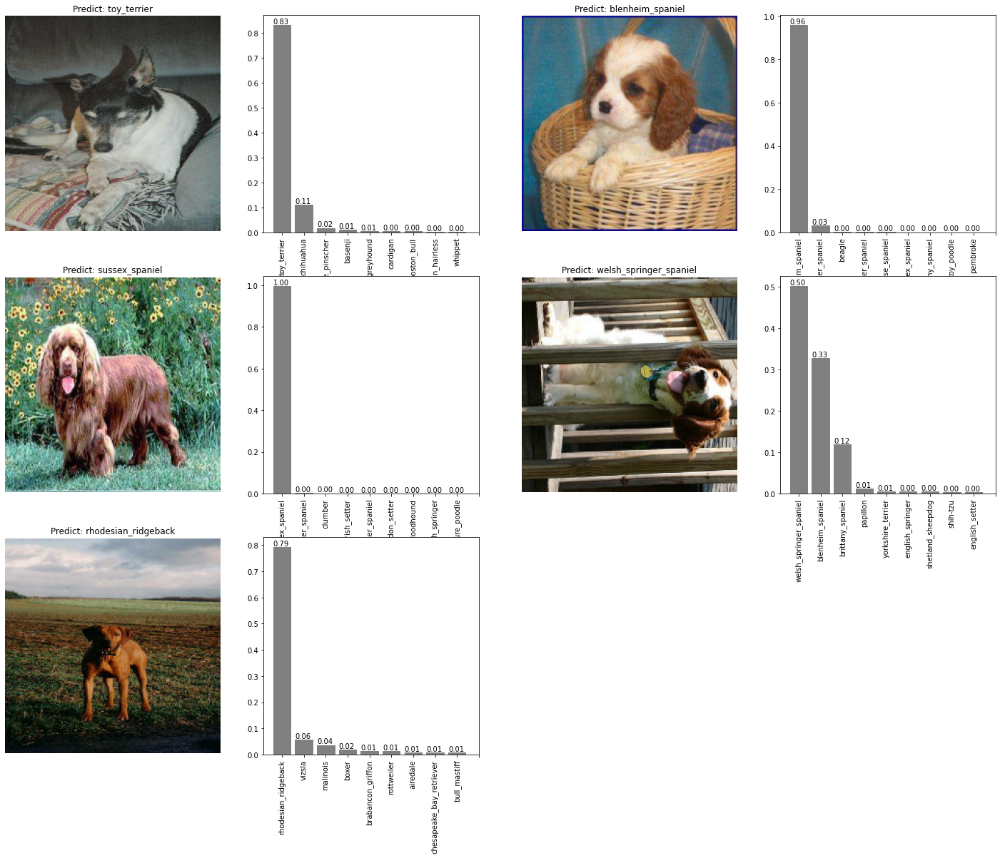

In [ ]:
plot_and_predict_random_images(loaded_model,test_images,labels=None,n_samples=5)